# SBIN Stock Analysis Report

### **Introduction**
<br>
This report presents a comprehensive analysis of the historical stock data of State Bank of India (SBIN). By applying data cleaning, feature engineering, trend detection, and time series forecasting techniques, the aim is to derive actionable insights that can assist investors and analysts in making data-driven decisions.


###  **Objective**
<br>
The primary objectives of this stock analysis are:
<br>
- To clean and preprocess SBIN's historical stock data for accurate analysis.
- To engineer key financial indicators such as daily returns and moving averages.
- To detect significant market signals like Golden and Death Crosses.
- To analyze seasonal trends and outliers in stock returns.
- To forecast future stock prices using ARIMA time series modeling.


**Tools and Technologies**
<br>
The following tools and technologies were used in this analysis:
<br>
PySpark: For scalable data preprocessing and feature engineering.
Databricks: For flexible envorment and data handling
Dataset Description
<br>
- Source: Historical stock data of SBIN (CSV format).
- Columns Included: Date, Open, High, Low, Close, Adj Close, Volume.
- Preprocessing:
- Removed irrelevant headers and null values.
- Converted 'Date' column to datetime format.
- Converted 'Volume' to Long and prices to Float data typ


## **Data Cleaning**

STEP 1: Reload cleanly with all columns as string

In [0]:
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

file_path ="/FileStore/tables/SBIN.csv"

df_raw = spark.read.option("header",True).option("inferSchema",False).csv(file_path)

STEP 2: remove the invalid row (second header row)

In [0]:
df_cleaned = df_raw.filter(~df_raw["close"].contains("SBIN.NS"))

In [0]:
df_cleaned.printSchema()

root
 |-- Date: string (nullable = true)
 |-- Adj Close: string (nullable = true)
 |-- Close: string (nullable = true)
 |-- High: string (nullable = true)
 |-- Low: string (nullable = true)
 |-- Open: string (nullable = true)
 |-- Volume: string (nullable = true)



STEP 3: Rename Price to DateString

In [0]:
df_cleaned = df_cleaned.withColumnRenamed("Price","DateString")

In [0]:
df_cleaned.printSchema()

 STEP 3: Convert string to proper date format

In [0]:
from pyspark.sql.functions import to_date

df_cleaned = df_cleaned.withColumn("Date", to_date("Date", "yyyy-MM-dd"))

STEP 4: Cast numeric columns

In [0]:
from pyspark.sql.functions import col
numeric_columns = ["Adj Close", "Close", "High", "Low", "Open", "Volume"]
for c in numeric_columns:
    df_cleaned = df_cleaned.withColumn(c, col(c).cast("double"))

In [0]:
df_cleaned.select("Date", "Close")
df11=df_cleaned.select("Date", "Close").display()
df_cleaned.printSchema()

Date,Close
1996-01-01,18.82324028
1996-01-02,18.22410583
1996-01-03,17.7381916
1996-01-04,17.67686272
1996-01-05,17.57779312
1996-01-08,17.06357384
1996-01-09,17.99765968
1996-01-10,17.17207909
1996-01-11,17.82782555
1996-01-12,17.8372612


root
 |-- Date: date (nullable = true)
 |-- Adj Close: double (nullable = true)
 |-- Close: double (nullable = true)
 |-- High: double (nullable = true)
 |-- Low: double (nullable = true)
 |-- Open: double (nullable = true)
 |-- Volume: double (nullable = true)



STEP 5: describe().show()
This command provides descriptive statistics, such as mean, stddev, min, and max for numerical columns like Open, Close, and Volume.

In [0]:
df_cleaned.describe().show()

+-------+------------------+------------------+------------------+------------------+------------------+--------------------+
|summary|         Adj Close|             Close|              High|               Low|              Open|              Volume|
+-------+------------------+------------------+------------------+------------------+------------------+--------------------+
|  count|              7252|              7252|              7252|              7252|              7252|                7252|
|   mean|179.75648101603545|196.59132582277996|  199.395767670917|193.97777824424082| 196.8422260955189| 3.096041367264203E7|
| stddev|  179.796472736595| 182.1391755800018|184.11894750734493| 180.2290290098045|182.31506605927143|3.4293410386775576E7|
|    min|       9.374207497|       13.34610176|       13.93580246|       13.21400928|       13.47819519|                 0.0|
|    max|       905.6500244|       905.6500244|             912.0|       883.2999878|             897.0|        4.4694

a) Drop Rows with Missing Values in Essential Columns


In [0]:
df_cleaned = df_cleaned.dropna(subset=["Date", "Close", "Volume"])


b) Fill Missing Values with Forward Fill (if applicable)


In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import last

# Define a window for forward fill (based on Date ordering)
window_spec = Window.orderBy("Date").rowsBetween(Window.unboundedPreceding, 0)

# Forward fill missing values in 'Close' column
df_cleaned = df_cleaned.withColumn("Close_filled", last("Close", ignorenulls=True).over(window_spec))


#  Step 4: Correlation and Trend Analysis
In this phase, we’ll investigate relationships between key variables and analyze long-term trends in the stock price of SBIN. This involves calculating correlation coefficients, analyzing moving averages, and detecting patterns in price movements.
<br>
## 4.1 Correlation Analysis
Understanding the correlation between variables like Volume, Close, High, and Low can help reveal relationships in the data. For instance, high trading volumes might correlate with price volatility.
<br>
**a) Correlation between  Close price,Voulme Open, High, Low, and Close**

In [0]:
from pyspark.sql.functions import col

# Filter out nulls to avoid issues
df_corr = df_cleaned.filter(col("Close").isNotNull() & col("Volume").isNotNull())

# Compute the correlation coefficient
correlation1 = df_corr.stat.corr("Close", "Volume")

Open_Close_Correlation=df_corr.stat.corr("Open", "Close") 
High_Close_Correlation=df_corr.stat.corr("High", "Close") 
Low_Close_Correlation=df_corr.stat.corr("Low", "Close") 
Volume_Close_Correlation=df_corr.stat.corr("Volume", "Close") 



print(f"Correlation between Close price,Voulme Open, High, Low, and Close: \n\t{correlation1},\n\t{Open_Close_Correlation},\n\t{High_Close_Correlation},\n\t{Low_Close_Correlation},\n\t{Volume_Close_Correlation}")

Correlation between Close price,Voulme Open, High, Low, and Close: 
	-0.24135796247220756,
	0.9996508780002403,
	0.9998389007743148,
	0.9998469796307878,
	-0.24135796247220756


The Daily Return is calculated using the following formula:
<br>
Daily Return
=
(
Close
today
−
Close
yesterday
Close
yesterday
)
×
100
Daily Return=( 
Close 
yesterday
Close 
today −Close 
yesterday )×100
<br>
This gives the percentage change in the stock's closing price from one day to the next.

In [0]:
from pyspark.sql.window import Window
from pyspark.sql.functions import lag, col, round

# Define a window specification ordered by Date
window_spec = Window.orderBy("Date")

# Use lag to get the previous day's Close price
df_with_prev = df_cleaned.withColumn("Prev_Close", lag("Close").over(window_spec))

# Calculate Daily_Return as percentage change
df_with_return = df_with_prev.withColumn(
    "Daily_Return",
    round(((col("Close") - col("Prev_Close")) / col("Prev_Close")) * 100, 4)  # rounded to 4 decimals
)

# Show the result
df_with_return.select("Date", "Close", "Prev_Close", "Daily_Return").show(10)


+----------+-----------+-----------+------------+
|      Date|      Close| Prev_Close|Daily_Return|
+----------+-----------+-----------+------------+
|1996-01-01|18.82324028|       null|        null|
|1996-01-02|18.22410583|18.82324028|      -3.183|
|1996-01-03| 17.7381916|18.22410583|     -2.6663|
|1996-01-04|17.67686272| 17.7381916|     -0.3457|
|1996-01-05|17.57779312|17.67686272|     -0.5604|
|1996-01-08|17.06357384|17.57779312|     -2.9254|
|1996-01-09|17.99765968|17.06357384|      5.4742|
|1996-01-10|17.17207909|17.99765968|     -4.5872|
|1996-01-11|17.82782555|17.17207909|      3.8187|
|1996-01-12| 17.8372612|17.82782555|      0.0529|
+----------+-----------+-----------+------------+
only showing top 10 rows



**4.3 Price Volatility Analysis**
<br>
Volatility indicates how much the price fluctuates over a given period. High volatility often signals periods of high uncertainty, which might be important for risk management or short-term trading.
<br>
**a) Calculate Rolling Standard Deviation (Volatility)**
<br>
Calculate the rolling standard deviation of the daily returns as a measure of volatility. This will help determine periods when the stock was more volatile.


In [0]:

from pyspark.sql.window import Window
from pyspark.sql.functions import stddev

# Define a 30-day rolling window
window_30 = Window.orderBy("Date").rowsBetween(-29, 0)

# Add 30-day rolling standard deviation (volatility) to df_with_return
df_with_volatility = df_with_return.withColumn("Volatility_30", stddev("Daily_Return").over(window_30))

# Show result
df_with_volatility.select("Date", "Daily_Return", "Volatility_30").show(10)


+----------+------------+------------------+
|      Date|Daily_Return|     Volatility_30|
+----------+------------+------------------+
|1996-01-01|        null|              null|
|1996-01-02|      -3.183|              null|
|1996-01-03|     -2.6663|0.3653620738390889|
|1996-01-04|     -0.3457|1.5112045162717056|
|1996-01-05|     -0.5604|1.4451463651363021|
|1996-01-08|     -2.9254|1.3682642993954055|
|1996-01-09|      5.4742| 3.263427182579688|
|1996-01-10|     -4.5872| 3.321499709396918|
|1996-01-11|      3.8187| 3.560295998303472|
|1996-01-12|      0.0529|3.3379390761532948|
+----------+------------+------------------+
only showing top 10 rows



Step 2: Compute 50-day and 200-day Moving Averages

In [0]:
from pyspark.sql.functions import avg

# Define moving average windows ordered by Date
window_50 = Window.orderBy("Date").rowsBetween(-49, 0)    # 50-day window
window_200 = Window.orderBy("Date").rowsBetween(-199, 0)  # 200-day window

# Compute SMAs
df_with_sma = df_with_return \
    .withColumn("SMA_50", avg("Close").over(window_50)) \
    .withColumn("SMA_200", avg("Close").over(window_200))

# Show sample output
df_with_sma.select("Date", "Close", "SMA_50", "SMA_200").display()


Date,Close,SMA_50,SMA_200
1996-01-01,18.82324028,18.82324028,18.82324028
1996-01-02,18.22410583,18.523673055,18.523673055
1996-01-03,17.7381916,18.261845903333334,18.261845903333334
1996-01-04,17.67686272,18.1156001075,18.1156001075
1996-01-05,17.57779312,18.00803871,18.00803871
1996-01-08,17.06357384,17.850627898333332,17.850627898333332
1996-01-09,17.99765968,17.871632438571428,17.871632438571428
1996-01-10,17.17207909,17.78418827,17.78418827
1996-01-11,17.82782555,17.78903685666667,17.78903685666667
1996-01-12,17.8372612,17.793859291,17.793859291


In [0]:
df_with_sma.display()

Date,Adj Close,Close,High,Low,Open,Volume,Close_filled,Prev_Close,Daily_Return,SMA_50,SMA_200
1996-01-01,12.20525646,18.82324028,18.97892189,18.54018402,18.69114685,4.3733533E7,18.82324028,null,null,18.82324028,18.82324028
1996-01-02,11.81676674,18.22410583,18.96476746,17.7381916,18.89400482,5.616728E7,18.22410583,18.82324028,-3.183,18.523673055,18.523673055
1996-01-03,11.50169373,17.7381916,18.56848907,17.64383888,18.3278923,6.8296318E7,17.7381916,18.22410583,-2.6663,18.261845903333334,18.261845903333334
1996-01-04,11.46192646,17.67686272,17.83254242,17.22397232,17.50231171,8.607388E7,17.67686272,17.7381916,-0.3457,18.1156001075,18.1156001075
1996-01-05,11.39768887,17.57779312,17.78536606,17.45985222,17.7381916,7.6613039E7,17.57779312,17.67686272,-0.5604,18.00803871,18.00803871
1996-01-08,11.06426239,17.06357384,17.64383888,16.92204666,17.47872353,5.5395172E7,17.06357384,17.57779312,-2.9254,17.850627898333332,17.850627898333332
1996-01-09,11.66993523,17.99765968,18.6817112,16.70503616,16.88902283,8.205754E7,17.99765968,17.06357384,5.4742,17.871632438571428,17.871632438571428
1996-01-10,11.13461781,17.17207909,17.71460342,17.05413818,17.40795898,5.4360749E7,17.17207909,17.99765968,-4.5872,17.78418827,17.78418827
1996-01-11,11.55981541,17.82782555,17.92689514,16.98337555,16.98337555,6.5973105E7,17.82782555,17.17207909,3.8187,17.78903685666667,17.78903685666667
1996-01-12,11.56593132,17.8372612,18.23353958,17.57307434,17.87971878,1.02152486E8,17.8372612,17.82782555,0.0529,17.793859291,17.793859291


**4.2 Analyze monthly average prices and volume (seasonality)**

In [0]:
from pyspark.sql.functions import year, month

# Add Year and Month columns
df_seasonal = df_cleaned.withColumn("Year", year("Date")).withColumn("Month", month("Date"))

# Group by Year and Month and get average Close and Volume
monthly_stats = df_seasonal.groupBy("Year", "Month") \
    .agg(
        avg("Close").alias("Avg_Close"),
        avg("Volume").alias("Avg_Volume")
    ) \
    .orderBy("Year", "Month")

# Show monthly trends
# monthly_stats.show(12)
monthly_stats.display()


Year,Month,Avg_Close,Avg_Volume
1996,1,17.98022494086956,6.904004017391305E7
1996,2,22.687856583333332,6.5497278333333336E7
1996,3,22.114106314285713,2.5723937285714287E7
1996,4,26.552391399090904,8.80580340909091E7
1996,5,26.211008487826092,1.40691622E8
1996,6,28.554714392499996,1.8540576055E8
1996,7,28.49802075304348,2.1781562986956522E8
1996,8,26.109580300454546,9.40997659090909E7
1996,9,25.19425228619047,1.5684222066666666E8
1996,10,21.13343031478261,1.9213743382608697E8


**4.3 Detect anomalous Daily_Returns using mean ± 3 * stddev**


In [0]:
#  3.3 Identify volatility using 30-day rolling standard deviation
from pyspark.sql.functions import stddev

# 30-day rolling window for standard deviation of Daily_Return
window_30 = Window.orderBy("Date").rowsBetween(-29, 0)

df_volatility = df_with_sma.withColumn("Volatility_30", stddev("Daily_Return").over(window_30))

# View volatility
df_volatility.select("Date", "Daily_Return", "Volatility_30").show(10)



+----------+------------+------------------+
|      Date|Daily_Return|     Volatility_30|
+----------+------------+------------------+
|1996-01-01|        null|              null|
|1996-01-02|      -3.183|              null|
|1996-01-03|     -2.6663|0.3653620738390889|
|1996-01-04|     -0.3457|1.5112045162717056|
|1996-01-05|     -0.5604|1.4451463651363021|
|1996-01-08|     -2.9254|1.3682642993954055|
|1996-01-09|      5.4742| 3.263427182579688|
|1996-01-10|     -4.5872| 3.321499709396918|
|1996-01-11|      3.8187| 3.560295998303472|
|1996-01-12|      0.0529|3.3379390761532948|
+----------+------------+------------------+
only showing top 10 rows



In [0]:
from pyspark.sql.functions import mean, stddev

# Compute mean and stddev of Daily_Return
df_seasonal = df_cleaned.withColumn("Year", year("Date")).withColumn("Month", month("Date"))
stats = df_volatility.select(mean("Daily_Return").alias("mean_return"),
                           stddev("Daily_Return").alias("stddev_return")).collect()[0]

mean_val = stats["mean_return"]
stddev_val = stats["stddev_return"]

# Filter for anomalies (returns outside mean ± 3 * stddev)
anomalies = df_volatility.filter(
    (col("Daily_Return") > mean_val + 3 * stddev_val) |
    (col("Daily_Return") < mean_val - 3 * stddev_val)
)

# Show anomalous return days
anomalies.select("Date", "Daily_Return", "Close", "Volume").orderBy("Date").show(10)


+----------+------------+-----------+------------+
|      Date|Daily_Return|      Close|      Volume|
+----------+------------+-----------+------------+
|1997-02-28|     10.0142| 29.2302742| 6.2950384E7|
|1997-03-31|     -9.9677|26.33366585|    641215.0|
|1997-10-28|     -9.2883|23.45121002| 8.8032501E7|
|1997-10-29|      8.2478|25.38542747| 6.4942921E7|
|1998-06-17|      9.5971|20.14888763| 6.3871403E7|
|1998-10-05|     -7.9871|17.44569969|  3.686299E7|
|1998-10-08|     -7.3643|15.78510284|  8.940025E7|
|1998-10-14|      7.8298| 15.6577282| 7.3220428E7|
|1999-01-08|      8.0117|17.42682838|1.13615932E8|
|1999-03-01|      9.6928|15.16237926| 7.4864811E7|
+----------+------------+-----------+------------+
only showing top 10 rows



**4.4 Detecting Seasonal Patterns**
<br>
If stock prices exhibit seasonal patterns (e.g., specific months or quarters), understanding these can be beneficial for making strategic decisions.
<br>
**a) Monthly Trends in Closing Prices**
<br>
Identify average closing prices by month to see if any months consistently show higher or lower averages, which might indicate a seasonal effect.



In [0]:
from pyspark.sql.functions import month, avg

# Extract the month from the Date column
df_with_month = df_cleaned.withColumn("Month", month("Date"))

# Group by month and calculate average Close price
monthly_avg = df_with_month.groupBy("Month").agg(
    avg("Close").alias("Avg_Close")
).orderBy("Month")

# Show average closing prices by month
# monthly_avg.show(12)
monthly_avg.display()

Month,Avg_Close
1,191.32007575759687
2,194.5866001671478
3,183.84446982395033
4,186.16385585054093
5,194.6584830679455
6,197.39971339180198
7,202.94584922913924
8,200.23200493491086
9,202.75401089394683
10,202.73078999399024


**4.5 Detect Anomalous Trends**
<br>
Identify outliers in daily returns, which may point to unusual events or errors in the data.
Identifying outliers in daily returns is a powerful way to detect:
<br>
Unusual market events (e.g., news shocks, earnings reports)
<br>
Potential data errors or anomalies
<br>
High-risk trading days
<br>
We’ll use Z-score or IQR (Interquartile Range) to find outliers.
<br>

In [0]:
from pyspark.sql.functions import mean, stddev, col

# Calculate mean and std deviation of Daily_Return
stats = df_with_return.select(
    mean("Daily_Return").alias("mean_return"),
    stddev("Daily_Return").alias("std_return")
).collect()[0]

mean_return = stats['mean_return']
std_return = stats['std_return']

# Add Z-score column
df_with_zscore = df_with_return.withColumn(
    "Z_Score",
    (col("Daily_Return") - mean_return) / std_return
)

# Filter where Z-score is greater than 3 or less than -3 (outliers)
outliers = df_with_zscore.filter((col("Z_Score") > 3) | (col("Z_Score") < -3))

outliers.select("Date", "Close", "Daily_Return", "Z_Score").show(10)


+----------+-----------+------------+-------------------+
|      Date|      Close|Daily_Return|            Z_Score|
+----------+-----------+------------+-------------------+
|1997-02-28| 29.2302742|     10.0142|   4.20424191404475|
|1997-03-31|26.33366585|     -9.9677| -4.251912758396686|
|1997-10-28|23.45121002|     -9.2883|-3.9643969823965697|
|1997-10-29|25.38542747|      8.2478|  3.456717824073298|
|1998-06-17|20.14888763|      9.5971| 4.0277290642218935|
|1998-10-05|17.44569969|     -7.9871| -3.413741215938886|
|1998-10-08|15.78510284|     -7.3643| -3.150178034760093|
|1998-10-14| 15.6577282|      7.8298| 3.2798241026013395|
|1999-01-08|17.42682838|      8.0117|  3.356802494792127|
|1999-03-01|15.16237926|      9.6928|  4.068228416243105|
+----------+-----------+------------+-------------------+
only showing top 10 rows



5.1 Export data to Pandas for forecasting

In [0]:
# Convert to Pandas DataFrame for modeling (if using smaller sample)
import pandas as pd
df_pandas = df_seasonal.select("Date", "Close").orderBy("Date").toPandas()
df_pandas.set_index("Date", inplace=True)


In [0]:
df_pandas1 = df_seasonal.select("Date", "Close").orderBy("Date").toPandas()

# Convert Date to datetime and set as index
df_pandas1['Date'] = pd.to_datetime(df_pandas1['Date'])
df_pandas1.set_index('Date', inplace=True)

 ARIMA Model using statsmodels

/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_predic

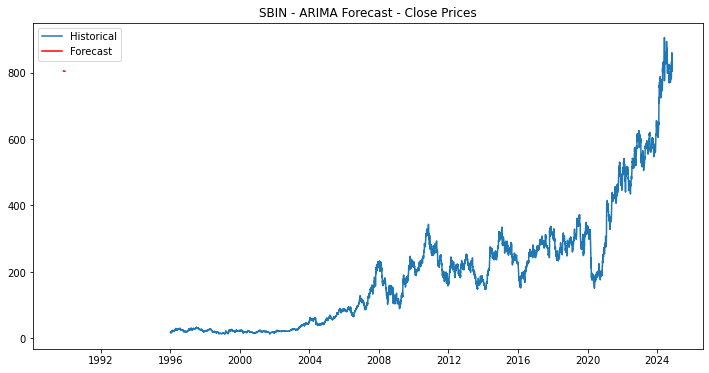

In [0]:
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Fit ARIMA model
model = ARIMA(df_pandas["Close"], order=(5,1,0))  # (p,d,q) can be tuned
model_fit = model.fit()

# Forecast the next 30 days
forecast = model_fit.forecast(steps=30)

# Plot
plt.figure(figsize=(12,6))
plt.plot(df_pandas["Close"], label="Historical")
plt.plot(forecast.index, forecast, label="Forecast", color='red')
plt.legend()
plt.title("SBIN - ARIMA Forecast - Close Prices")
plt.show()


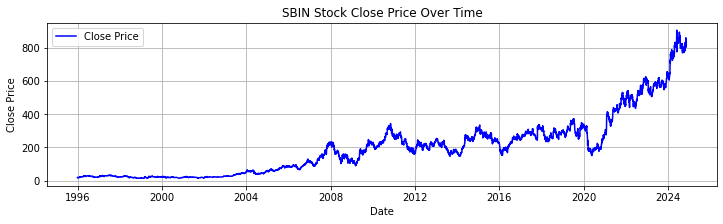

In [0]:
import matplotlib.pyplot as plt



# Plot
plt.figure(figsize=(12, 3))
plt.plot(df_pandas1.index, df_pandas1["Close"], label="Close Price", color='blue')
plt.title("SBIN Stock Close Price Over Time")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.grid(True)
plt.legend()
plt.show()


##   Insights & Interpretation
<br>
Periods where the Close line stays consistently above both SMAs suggest a strong bullish phase.
<br>
When the Close line dips below both SMAs, it might indicate consolidation or a bearish trend.
<br>
Tracking these crossovers helps investors align their strategies with momentum shifts.

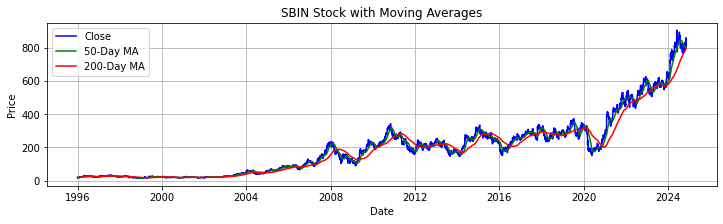

In [0]:

# Convert Spark DataFrame to Pandas DataFrame
pandas_df = df_with_sma.select("Date", "Close", "SMA_50", "SMA_200").orderBy("Date").toPandas()

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 3))
plt.plot(pandas_df["Date"], pandas_df["Close"], label="Close", color='blue')
plt.plot(pandas_df["Date"], pandas_df["SMA_50"], label="50-Day MA", color='green')
plt.plot(pandas_df["Date"], pandas_df["SMA_200"], label="200-Day MA", color='red')
plt.title("SBIN Stock with Moving Averages")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.show()


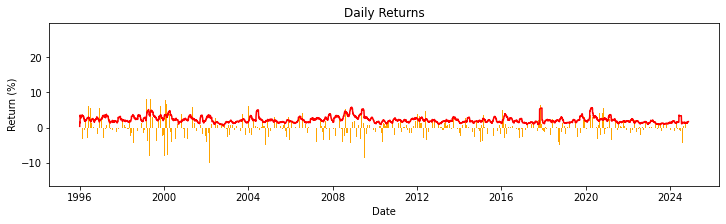

In [0]:
pandas_df = df_with_volatility.select("Date", "Daily_Return","Volatility_30").orderBy("Date").toPandas()
#df_with_volatility.select("Date", "Daily_Return", "Volatility_30").show(10)
# Bar plot
plt.figure(figsize=(12, 3))
plt.bar(pandas_df["Date"], pandas_df["Daily_Return"], color='orange')
plt.plot(pandas_df["Date"], pandas_df["Volatility_30"], label="Volatility", color='red')
plt.title("Daily Returns")
plt.xlabel("Date")
plt.ylabel("Return (%)")
plt.show()

We calculated the Z-Score for the daily returns to identify statistical outliers — days with returns significantly different from the norm. The orange bars in the plot represent daily return percentages, while the red line represents the Z-Score.

A Z-Score above +3 or below -3 typically flags an outlier. These may correspond to major market events, earnings announcements, or anomalies in data that merit further investigation.

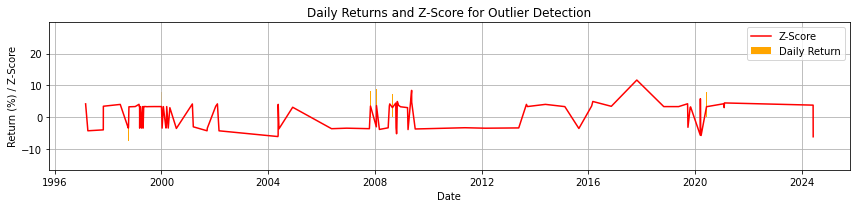

In [0]:
# Convert to Pandas
outliers_pd = outliers.select("Date", "Close", "Daily_Return", "Z_Score").orderBy("Date").toPandas()

# Plotting
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 3))
plt.bar(outliers_pd["Date"], outliers_pd["Daily_Return"], color='orange', label="Daily Return")
plt.plot(outliers_pd["Date"], outliers_pd["Z_Score"], label="Z-Score", color='red')
plt.title("Daily Returns and Z-Score for Outlier Detection")
plt.xlabel("Date")
plt.ylabel("Return (%) / Z-Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [0]:
df_cleaned.display()

Date,Adj Close,Close,High,Low,Open,Volume,Close_filled
1996-01-01,12.20525646,18.82324028,18.97892189,18.54018402,18.69114685,4.3733533E7,18.82324028
1996-01-02,11.81676674,18.22410583,18.96476746,17.7381916,18.89400482,5.616728E7,18.22410583
1996-01-03,11.50169373,17.7381916,18.56848907,17.64383888,18.3278923,6.8296318E7,17.7381916
1996-01-04,11.46192646,17.67686272,17.83254242,17.22397232,17.50231171,8.607388E7,17.67686272
1996-01-05,11.39768887,17.57779312,17.78536606,17.45985222,17.7381916,7.6613039E7,17.57779312
1996-01-08,11.06426239,17.06357384,17.64383888,16.92204666,17.47872353,5.5395172E7,17.06357384
1996-01-09,11.66993523,17.99765968,18.6817112,16.70503616,16.88902283,8.205754E7,17.99765968
1996-01-10,11.13461781,17.17207909,17.71460342,17.05413818,17.40795898,5.4360749E7,17.17207909
1996-01-11,11.55981541,17.82782555,17.92689514,16.98337555,16.98337555,6.5973105E7,17.82782555
1996-01-12,11.56593132,17.8372612,18.23353958,17.57307434,17.87971878,1.02152486E8,17.8372612


In [0]:
print(df_pandas.columns)
print(df_pandas1.columns)

Index(['Close'], dtype='object')
Index(['Close'], dtype='object')


/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/databricks/python/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_predic

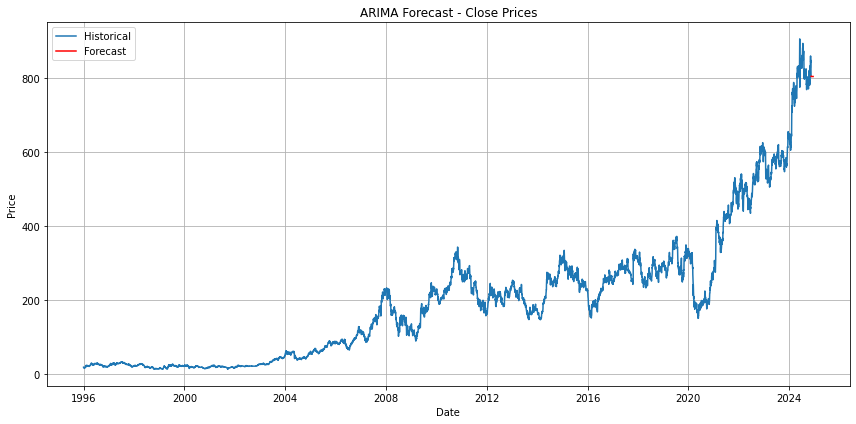

In [0]:

import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Step 1: Convert 'Date' to datetime and set as index
# df_pandas['Date'] = pd.to_datetime(df_pandas['Date'])
# df_pandas.set_index('Date', inplace=True)

# Step 2: Use only the 'Close' column (and drop any NaNs)
df_close = df_pandas[['Close']].dropna()

# Step 3: Fit the ARIMA model
model = ARIMA(df_close, order=(5, 1, 0))
model_fit = model.fit()

# Step 4: Forecast next 30 days
forecast = model_fit.forecast(steps=30)

# Step 5: Create a date range for the forecast
last_date = df_close.index[-1]
forecast_index = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=30, freq='D')

# Step 6: Plot the results
plt.figure(figsize=(12, 6))
plt.plot(df_close.index, df_close['Close'], label='Historical')
plt.plot(forecast_index, forecast, label='Forecast', color='red')
plt.title('ARIMA Forecast - Close Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Step 6: Strategic Insights and Visualization
<br>
6.1 Identify Price Trends: Uptrend, Downtrend, Sideways


In [0]:
df_with_sma.select("Open", "Close", "Volume", "Daily_Return").describe().show()


+-------+------------------+------------------+--------------------+-------------------+
|summary|              Open|             Close|              Volume|       Daily_Return|
+-------+------------------+------------------+--------------------+-------------------+
|  count|              7252|              7252|                7252|               7251|
|   mean| 196.8422260955189|196.59132582277996| 3.096041367264203E7|0.07957312094883462|
| stddev|182.31506605927143| 182.1391755800018|3.4293410386775576E7|  2.363000769737681|
|    min|       13.47819519|       13.34610176|                 0.0|            -14.404|
|    max|             897.0|       905.6500244|        4.46948261E8|            27.6872|
+-------+------------------+------------------+--------------------+-------------------+



<Figure size 1440x720 with 0 Axes>

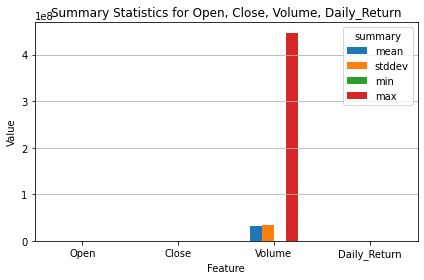

In [0]:
# 1. Compute summary statistics
summary_df = df_with_sma.select("Open", "Close", "Volume", "Daily_Return").describe()

# 2. Convert to Pandas for plotting
summary_pd = summary_df.toPandas()

# 3. Transpose for easier plotting
summary_pd.set_index("summary", inplace=True)
summary_transposed = summary_pd.transpose()

# 4. Plot using matplotlib
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
summary_transposed[["mean", "stddev", "min", "max"]].astype(float).plot(kind='bar')
plt.title("Summary Statistics for Open, Close, Volume, Daily_Return")
plt.ylabel("Value")
plt.xlabel("Feature")
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [0]:
# Top 10 highest volume days
df_with_sma.orderBy(col("Volume").desc()).select("Date", "Volume", "Close").show(10)


+----------+------------+-----------+
|      Date|      Volume|      Close|
+----------+------------+-----------+
|1996-07-04|4.46948261E8|27.73951149|
|1996-07-08|4.08225216E8|29.67373085|
|1996-07-09|3.62196026E8|29.42369652|
|1996-07-17|3.60305236E8|30.27758217|
|1996-07-05|3.46132788E8|28.08861542|
|1996-06-20|  3.106084E8|28.62642288|
|1996-10-04|3.08807168E8|21.73400116|
|1996-10-03|2.99422638E8| 22.6114769|
|1996-09-19|2.97267413E8|24.81931496|
|1996-06-21|2.93865262E8|28.14522552|
+----------+------------+-----------+
only showing top 10 rows



In [0]:
from pyspark.sql.functions import stddev

# 30-day rolling window for standard deviation of Daily_Return
window_30 = Window.orderBy("Date").rowsBetween(-29, 0)

df_volatility = df_with_sma.withColumn("Volatility_30", stddev("Daily_Return").over(window_30))

# View volatility
df_volatility.select("Date", "Daily_Return", "Volatility_30").show(10)


+----------+------------+------------------+
|      Date|Daily_Return|     Volatility_30|
+----------+------------+------------------+
|1996-01-01|        null|              null|
|1996-01-02|      -3.183|              null|
|1996-01-03|     -2.6663|0.3653620738390889|
|1996-01-04|     -0.3457|1.5112045162717056|
|1996-01-05|     -0.5604|1.4451463651363021|
|1996-01-08|     -2.9254|1.3682642993954055|
|1996-01-09|      5.4742| 3.263427182579688|
|1996-01-10|     -4.5872| 3.321499709396918|
|1996-01-11|      3.8187| 3.560295998303472|
|1996-01-12|      0.0529|3.3379390761532948|
+----------+------------+------------------+
only showing top 10 rows



In [0]:
from pyspark.sql.functions import lag, when, col
from pyspark.sql.window import Window

# Define the window to order by Date
window_spec = Window.orderBy("Date")

# Add previous values of SMA_50 and SMA_200
df_trend = df_volatility \
    .withColumn("Prev_SMA_50", lag("SMA_50").over(window_spec)) \
    .withColumn("Prev_SMA_200", lag("SMA_200").over(window_spec)) \
    .withColumn("Trend_Signal", when(
        (col("Prev_SMA_50") < col("Prev_SMA_200")) & (col("SMA_50") >= col("SMA_200")), "Golden Cross"
    ).when(
        (col("Prev_SMA_50") > col("Prev_SMA_200")) & (col("SMA_50") <= col("SMA_200")), "Death Cross"
    ).otherwise(None))

# Filter and display crossover events
df_trend.filter(col("Trend_Signal").isNotNull()) \
    .select("Date", "SMA_50", "SMA_200", "Prev_SMA_50", "Prev_SMA_200", "Trend_Signal") \
    .show(10)


+----------+------------------+------------------+------------------+------------------+------------+
|      Date|            SMA_50|           SMA_200|       Prev_SMA_50|      Prev_SMA_200|Trend_Signal|
+----------+------------------+------------------+------------------+------------------+------------+
|1996-10-11|     24.8423371128|24.868260355149996|     24.9675423434|24.853848075999995| Death Cross|
|1997-02-24|24.712320022400004|24.677032289499998|     24.6072117994|24.675805711749998|Golden Cross|
|1997-10-03|28.366387519800004|28.438189468649988|28.455738983200003|28.421064577399992| Death Cross|
|1998-04-16|25.533749199200006|25.516836586150003|25.425810432600006|25.543184414050003|Golden Cross|
|1998-06-19|24.064592934000004|24.112570905899993|24.249806061199997|24.150594797349996| Death Cross|
|1999-03-31|     16.9794118882|16.976982321649988|16.888645191200002| 16.97441123474999|Golden Cross|
|2000-02-02|22.491649322200004|22.503065967499992|     22.4607962032|22.4587204836

In [0]:
from pyspark.sql.functions import when, col

# Add market trend insights
df_insights = df_trend.withColumn("Market_Trend", when(
    (col("Close") > col("SMA_50")) & (col("SMA_50") > col("SMA_200")), "Uptrend"
).when(
    (col("Close") < col("SMA_50")) & (col("SMA_50") < col("SMA_200")), "Downtrend"
).otherwise("Sideways"))

# Display trend classification
df_insights.select("Date", "Close", "SMA_50", "SMA_200", "Market_Trend") \
    .orderBy("Date") \
    .show(10, truncate=False)


+----------+-----------+------------------+------------------+------------+
|Date      |Close      |SMA_50            |SMA_200           |Market_Trend|
+----------+-----------+------------------+------------------+------------+
|1996-01-01|18.82324028|18.82324028       |18.82324028       |Sideways    |
|1996-01-02|18.22410583|18.523673055      |18.523673055      |Sideways    |
|1996-01-03|17.7381916 |18.261845903333334|18.261845903333334|Sideways    |
|1996-01-04|17.67686272|18.1156001075     |18.1156001075     |Sideways    |
|1996-01-05|17.57779312|18.00803871       |18.00803871       |Sideways    |
|1996-01-08|17.06357384|17.850627898333332|17.850627898333332|Sideways    |
|1996-01-09|17.99765968|17.871632438571428|17.871632438571428|Sideways    |
|1996-01-10|17.17207909|17.78418827       |17.78418827       |Sideways    |
|1996-01-11|17.82782555|17.78903685666667 |17.78903685666667 |Sideways    |
|1996-01-12|17.8372612 |17.793859291      |17.793859291      |Sideways    |
+----------+

6.2 High Volatility Detection

In [0]:
df_insights = df_insights.withColumn("High_Volatility_Flag", when(col("Volatility_30") > 5.0, "Yes").otherwise("No"))

# Show where high volatility occurs
df_insights.select("Date", "Volatility_30", "High_Volatility_Flag").filter(col("High_Volatility_Flag") == "Yes").show(10)


+----------+------------------+--------------------+
|      Date|     Volatility_30|High_Volatility_Flag|
+----------+------------------+--------------------+
|1999-04-06| 5.016029094449893|                 Yes|
|1999-04-07|5.0199353834097495|                 Yes|
|1999-04-08| 5.044114463216955|                 Yes|
|1999-04-09| 5.134980418059117|                 Yes|
|2004-06-24| 5.008085985211901|                 Yes|
|2008-11-03| 5.242996034474682|                 Yes|
|2008-11-04| 5.378769390594413|                 Yes|
|2008-11-05|5.3867230340285115|                 Yes|
|2008-11-06| 5.430832316202797|                 Yes|
|2008-11-07| 5.463342227767965|                 Yes|
+----------+------------------+--------------------+
only showing top 10 rows



6.3 Visualizations (if using Databricks)

In [0]:
# Create a temporary table
df_insights.createOrReplaceTempView("stock_insights")

In [0]:
%sql
-- Run this SQL:
SELECT Date, Close, Volume FROM stock_insights ORDER BY Date
-- Then visualize as Line or Area Chart

Date,Close,Volume
1996-01-01,18.82324028,4.3733533E7
1996-01-02,18.22410583,5.616728E7
1996-01-03,17.7381916,6.8296318E7
1996-01-04,17.67686272,8.607388E7
1996-01-05,17.57779312,7.6613039E7
1996-01-08,17.06357384,5.5395172E7
1996-01-09,17.99765968,8.205754E7
1996-01-10,17.17207909,5.4360749E7
1996-01-11,17.82782555,6.5973105E7
1996-01-12,17.8372612,1.02152486E8


Daily Returns Distribution

In [0]:
# Display Daily_Return as histogram (Databricks built-in display)
display(df_insights.select("Daily_Return"))



Daily_Return
null
-3.183
-2.6663
-0.3457
-0.5604
-2.9254
5.4742
-4.5872
3.8187
0.0529


The histogram shows the distribution of daily return percentages, helping us understand the volatility and skewness of the stock. A bell-shaped curve suggests normal behavior, while fat tails or skewness could indicate unusual market behavior or extreme days.

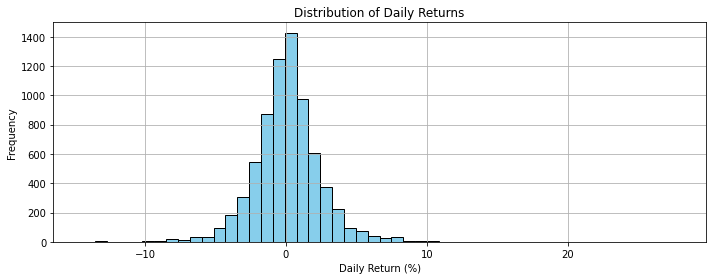

In [0]:
df_return_pd = df_insights.select("Daily_Return").toPandas()

# Plot histogram
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.hist(df_return_pd["Daily_Return"].dropna(), bins=50, color='skyblue', edgecolor='black')
plt.title("Distribution of Daily Returns")
plt.xlabel("Daily Return (%)")
plt.ylabel("Frequency")
plt.grid(True)
plt.tight_layout()
plt.show()

Step 7: Presentation and Reporting
<br>
7.1 Export Cleaned and Enriched Data

In [0]:
# Save as CSV to Databricks FileStore
output_path = "/FileStore/tables/SBIN.csv"
df_insights.coalesce(1).write.option("header", True).mode("overwrite").csv(output_path)


7.2 Visual Summary with SQL or Display()

In [0]:
%sql
-- Use this in a SQL cell
SELECT Date, Close, SMA_50, SMA_200, Market_Trend FROM stock_insights ORDER BY Date

Date,Close,SMA_50,SMA_200,Market_Trend
